<a href="https://colab.research.google.com/github/opethaiwoh/Early-Detection-of-Alzheimer-Diseases/blob/main/Final_EfficientNetB0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### installing all Python dependencies

In [ ]:
#!pip install pydicom

In [ ]:
#!pip install keras-tuner

In [ ]:
#!pip install seaborn

In [ ]:
#!pip install scikit-image

In [ ]:
#!pip install timm

In [ ]:
#!pip install tensorflow timm

In [ ]:
#!pip install tensorflow timm pydicom

In [ ]:
#!pip install onnx-tf

In [ ]:
#!pip install vit-keras

In [ ]:
#!pip install --upgrade tensorflow

In [ ]:
#!pip install vit-keras

In [ ]:
#!pip install lime

In [ ]:
#!pip install tf2torch

In [ ]:
#!pip install grad-cam

In [ ]:
#pip install tf-keras-vis

In [ ]:
#pip install lime

In [ ]:
#pip install tensorflow efficientnet

In [ ]:
import os
import random
import pandas as pd
import pydicom
import cv2
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from vit_keras import vit
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50
import random
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from skimage.transform import resize
import tensorflow as tf
from skimage.segmentation import mark_boundaries
from lime.lime_image import LimeImageExplainer
import matplotlib.patches as patches
from lime.wrappers.scikit_image import SegmentationAlgorithm
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils import normalize
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from lime import lime_image
from tensorflow.keras.layers import (Conv2D,MaxPooling2D,Flatten,Dense,Dropout,BatchNormalization,)
from tensorflow.keras.applications import MobileNetV2
from sklearn.metrics import classification_report
from tensorflow.keras.layers import Dropout
import efficientnet.tfkeras as efn
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy

C:\Users\ajala\AppData\Roaming\Python\Python311\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\ajala\AppData\Roaming\Python\Python311\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.14.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file

In [ ]:
# Load CSV file
csv_path = "C://Users//ajala//Downloads//OPEYEMI//AD_1000.csv"
df = pd.read_csv(csv_path)
df.head()

,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded
0,I1221058,002_S_0413,CN,F,90,y2,MRI,Sagittal 3D FLAIR,Original,8/27/19,DCM,9/11/23
1,I1221059,002_S_0413,CN,F,90,y2,MRI,HighResHippocampus,Original,8/27/19,DCM,9/11/23
2,I1221060,002_S_0413,CN,F,90,y2,MRI,Axial 3TE T2 STAR,Original,8/27/19,DCM,9/11/23
3,I1221061,002_S_0413,CN,F,90,y2,MRI,Axial 3TE T2 STAR,Original,8/27/19,DCM,9/11/23
4,I1221062,002_S_0413,CN,F,90,y2,MRI,Field Mapping,Original,8/27/19,DCM,9/11/23


In [ ]:
def list_dicom_files(start_path):
    dicom_files = []

    for dirpath, _, filenames in os.walk(start_path):
        for file in filenames:
            if file.endswith('.dcm'):
                dicom_files.append(os.path.join(dirpath, file))

    return dicom_files

base_path = "C://Users//ajala//Downloads//OPEYEMI//AD_ALL_1000//ADNI"
dicom_files = list_dicom_files(base_path)
print(len(dicom_files))

70706


In [ ]:
# Listing DICOM files
def list_dicom_files(start_path):
    return [os.path.join(dirpath, file) for dirpath, _, filenames in os.walk(start_path) for file in filenames if file.endswith('.dcm')]

# Label Mapping
def get_label(img_path):
    filename_parts = os.path.basename(img_path).split('_')
    subject = '_'.join(filename_parts[1:4])
    filtered_df = df[df['Subject'] == subject]

    if filtered_df.empty:
        print(f"No matching rows found for Subject: {subject}")
        return -1

    label = filtered_df['Group'].values[0]
    if label == 'CN':
        return 0
    elif label == 'MCI':
        return 1
    elif label == 'AD':
        return 2
    else:
        print(f"Unexpected label value: {label} for Subject: {subject}")
        return -1



In [ ]:
# Convert medical images from the DICOM format to a regular RGB format.
def dicom_to_rgb(dcm):
    pixel_array = dcm.pixel_array
    pixel_array = cv2.normalize(pixel_array, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    pixel_array = cv2.cvtColor(pixel_array, cv2.COLOR_GRAY2RGB)
    return pixel_array

In [ ]:
# Performing Data Augmentation
def augment(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.rot90(img, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    return img, label

In [ ]:
# load MRI images stored in the DICOM format,Re-size and Normalize
def load_data(img_path):
    img_path = img_path.numpy().decode('utf-8')
    dcm = pydicom.dcmread(img_path)
    img = dicom_to_rgb(dcm)

    # Resize and Normalize
    img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_AREA)
    img = img / 255.0

    label = get_label(img_path)
    return img, label

In [ ]:
# load image data and its corresponding label from a given image path tensor using TensorFlow operations.
def load_tf_dataset(img_path_tensor):
    img, label = tf.py_function(func=load_data, inp=[img_path_tensor], Tout=[tf.float32, tf.int64])
    img.set_shape([224, 224, 3])
    label.set_shape([])
    return img, label

In [ ]:
# Create a TensorFlow tf.data.Dataset from a list of image paths
def prepare_dataset(image_paths, augment_func=None):
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(load_tf_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    if augment_func:
        dataset = dataset.map(augment_func, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE).shuffle(len(image_paths)).prefetch(tf.data.AUTOTUNE)
    return dataset

In [ ]:
# Convert the TensorFlow dataset to numpy arrays
def dataset_to_numpy(tf_dataset, num_samples):
    images_np = np.zeros((num_samples, 224, 224, 3), dtype=np.float32)
    labels_np = np.zeros((num_samples,), dtype=np.int64)

    for i, (img, label) in enumerate(tf_dataset.unbatch().take(num_samples)):
        images_np[i] = img.numpy()
        labels_np[i] = label.numpy()

    return images_np, labels_np

In [ ]:
# Get and Normalize the DICOM files
def preprocess_image(dicom_path):
    # Load the DICOM file
    dcm = pydicom.dcmread(dicom_path)

    # Convert to RGB
    img = dicom_to_rgb(dcm)

    # Resize and Normalize
    img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_AREA)
    img = img / 255.0

    return img

In [ ]:
# Load CSV file
csv_path = "C://Users//ajala//Downloads//OPEYEMI//AD_1000.csv"
df = pd.read_csv(csv_path)

# Create a list of DICOM image paths
base_path = "C://Users//ajala//Downloads//OPEYEMI//AD_ALL_1000//ADNI"
image_paths = list_dicom_files(base_path)
print(f"Total DICOM files: {len(image_paths)}")

Total DICOM files: 70706


In [ ]:
# Separate image paths based on classes
paths_CN = [path for path in image_paths if get_label(path) == 0]
paths_MCI = [path for path in image_paths if get_label(path) == 1]
paths_AD = [path for path in image_paths if get_label(path) == 2]

In [ ]:
# Modifying the function to get the list of all images in each of the classes
def list_dicom_files(base_path):
    """Recursively list all DICOM files in a directory."""
    dicom_files = []
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.lower().endswith(".dcm"):
                dicom_files.append(os.path.join(root, file))
    return dicom_files

# Display the number of images in each class
print(f"Number of CN images: {len(paths_CN)}")
print(f"Number of MCI images: {len(paths_MCI)}")
print(f"Number of AD images: {len(paths_AD)}")

Number of CN images: 25899
Number of MCI images: 30575
Number of AD images: 14232


In [ ]:
# Ensure only 10 samples are selected for each class
paths_CN = paths_CN[:500]
paths_MCI = paths_MCI[:500]
paths_AD = paths_AD[:500]

In [ ]:
# Calculate the train/test split samples per class based on the total available images
train_ratio = 0.8
train_samples_CN = int(len(paths_CN) * train_ratio)
test_samples_CN = len(paths_CN) - train_samples_CN

train_samples_MCI = int(len(paths_MCI) * train_ratio)
test_samples_MCI = len(paths_MCI) - train_samples_MCI

train_samples_AD = int(len(paths_AD) * train_ratio)
test_samples_AD = len(paths_AD) - train_samples_AD

In [ ]:
# Split image paths for training and test for each class
train_paths_CN = paths_CN[:train_samples_CN]
test_paths_CN = paths_CN[train_samples_CN:]

train_paths_MCI = paths_MCI[:train_samples_MCI]
test_paths_MCI = paths_MCI[train_samples_MCI:]

train_paths_AD = paths_AD[:train_samples_AD]
test_paths_AD = paths_AD[train_samples_AD:]

In [ ]:
# Combine paths from all classes for training and test datasets
train_image_paths = train_paths_CN + train_paths_MCI + train_paths_AD
test_image_paths = test_paths_CN + test_paths_MCI + test_paths_AD

# Shuffle the datasets
random.shuffle(train_image_paths)
random.shuffle(test_image_paths)

In [ ]:
# Print the number of samples in training and test datasets
print(f"Number of training samples: {len(train_image_paths)}")
print(f"Number of test samples: {len(test_image_paths)}")

Number of training samples: 1200
Number of test samples: 300


In [ ]:
# Calculate and print the class distribution for the training dataset
train_class_distribution = {
    'CN': len(train_paths_CN),
    'MCI': len(train_paths_MCI),
    'AD': len(train_paths_AD)
}
print(f"Training data distribution - CN: {train_class_distribution['CN']}, MCI: {train_class_distribution['MCI']}, AD: {train_class_distribution['AD']}")

Training data distribution - CN: 400, MCI: 400, AD: 400


In [ ]:
# Calculate and print the class distribution for the test dataset
test_class_distribution = {
    'CN': len(test_paths_CN),
    'MCI': len(test_paths_MCI),
    'AD': len(test_paths_AD)
}
print(f"Test data distribution - CN: {test_class_distribution['CN']}, MCI: {test_class_distribution['MCI']}, AD: {test_class_distribution['AD']}")


Test data distribution - CN: 100, MCI: 100, AD: 100


In [ ]:
# The size of the mini-batches to be used during training
BATCH_SIZE = 24

In [ ]:
# Prepare the training and test datasets
train_dataset = prepare_dataset(train_image_paths, augment_func=augment)
test_dataset = prepare_dataset(test_image_paths, augment_func=None).shuffle(len(test_image_paths)).prefetch(tf.data.AUTOTUNE)

In [ ]:
# Convert the training and test datasets to numpy arrays
train_images, train_labels = dataset_to_numpy(train_dataset, len(train_image_paths))
test_images, test_labels = dataset_to_numpy(test_dataset, len(test_image_paths))

In [ ]:
#print the class distribution for the training dataset
print(train_images.shape)  # Expected to print (24, 224, 224, 3)
print(train_labels.shape)  # Expected to print (24,)
print(test_images.shape)   # Expected to print (6, 224, 224, 3)
print(test_labels.shape)   # Expected to print (6,)

(1200, 224, 224, 3)
(1200,)
(300, 224, 224, 3)
(300,)


In [ ]:
#Defining the numbers of classes

# Extract labels for each DICOM file
all_labels = [get_label(file) for file in dicom_files]

# Remove any -1 values (which indicates an error)
all_labels = [label for label in all_labels if label != -1]

# Compute the number of unique classes
num_classes = len(set(all_labels))

print(f"Number of unique classes: {num_classes}")

Number of unique classes: 3


In [ ]:
#Set the input shape and number of classes
input_shape = (224, 224, 3)

# Define class names (replace with your class names)
class_names = ['CN', 'MCI', 'AD']

# number of classes
num_classes = 3

In [ ]:
# Import necessary modules
import efficientnet.tfkeras as efn
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

# Replace EfficientNetB6 with EfficientNetB0
base_model = efn.EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)

# The rest of your code remains unchanged
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False


16804768/16804768 [==============================] - 0s 0us/step


In [ ]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss=SparseCategoricalCrossentropy(),
              metrics=['accuracy'])


In [ ]:
history = model.fit(train_images, train_labels,
                    batch_size=BATCH_SIZE,
                    epochs=15,  # You can change the number of epochs
                    verbose=1,
                    validation_data=(test_images, test_labels))

# Evaluate the model

score = model.evaluate(test_images, test_labels, verbose=0)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')


Epoch 1/15
50/50 [==============================] - 24s 425ms/step - loss: 1.0786 - accuracy: 0.4050 - val_loss: 0.8819 - val_accuracy: 0.6700
Epoch 2/15
50/50 [==============================] - 20s 409ms/step - loss: 0.9099 - accuracy: 0.5800 - val_loss: 0.6621 - val_accuracy: 0.8167
Epoch 3/15
50/50 [==============================] - 20s 411ms/step - loss: 0.7287 - accuracy: 0.6875 - val_loss: 0.4215 - val_accuracy: 0.9500
Epoch 4/15
50/50 [==============================] - 21s 415ms/step - loss: 0.5929 - accuracy: 0.7533 - val_loss: 0.2683 - val_accuracy: 0.9633
Epoch 5/15
50/50 [==============================] - 21s 423ms/step - loss: 0.4718 - accuracy: 0.8008 - val_loss: 0.1864 - val_accuracy: 0.9733
Epoch 6/15
50/50 [==============================] - 21s 420ms/step - loss: 0.4096 - accuracy: 0.8325 - val_loss: 0.1555 - val_accuracy: 0.9700
Epoch 7/15
50/50 [==============================] - 21s 423ms/step - loss: 0.3411 - accuracy: 0.8625 - val_loss: 0.1430 - val_accuracy: 0.9633

In [ ]:
# Print the model summary to identify the correct layer name
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 112, 112, 32)         128       ['stem_conv[0][0]']           
 n)                                                                                               
                                                                                                  
 stem_activation (Activatio  (None, 112, 112, 32)         0         ['stem_bn[0][0]']         

                                                                                                  
 block2b_expand_activation   (None, 56, 56, 144)          0         ['block2b_expand_bn[0][0]']   
 (Activation)                                                                                     
                                                                                                  
 block2b_dwconv (DepthwiseC  (None, 56, 56, 144)          1296      ['block2b_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block2b_bn (BatchNormaliza  (None, 56, 56, 144)          576       ['block2b_dwconv[0][0]']      
 tion)                                                                                            
                                                                                                  
 block2b_a

                                                                                                  
 block3b_dwconv (DepthwiseC  (None, 28, 28, 240)          6000      ['block3b_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block3b_bn (BatchNormaliza  (None, 28, 28, 240)          960       ['block3b_dwconv[0][0]']      
 tion)                                                                                            
                                                                                                  
 block3b_activation (Activa  (None, 28, 28, 240)          0         ['block3b_bn[0][0]']          
 tion)                                                                                            
                                                                                                  
 block3b_s

                                                                                                  
 block4b_bn (BatchNormaliza  (None, 14, 14, 480)          1920      ['block4b_dwconv[0][0]']      
 tion)                                                                                            
                                                                                                  
 block4b_activation (Activa  (None, 14, 14, 480)          0         ['block4b_bn[0][0]']          
 tion)                                                                                            
                                                                                                  
 block4b_se_squeeze (Global  (None, 480)                  0         ['block4b_activation[0][0]']  
 AveragePooling2D)                                                                                
                                                                                                  
 block4b_s

                                                                                                  
 block5a_dwconv (DepthwiseC  (None, 14, 14, 480)          12000     ['block5a_expand_activation[0]
 onv2D)                                                             [0]']                         
                                                                                                  
 block5a_bn (BatchNormaliza  (None, 14, 14, 480)          1920      ['block5a_dwconv[0][0]']      
 tion)                                                                                            
                                                                                                  
 block5a_activation (Activa  (None, 14, 14, 480)          0         ['block5a_bn[0][0]']          
 tion)                                                                                            
                                                                                                  
 block5a_s

                                                                                                  
 block5c_bn (BatchNormaliza  (None, 14, 14, 672)          2688      ['block5c_dwconv[0][0]']      
 tion)                                                                                            
                                                                                                  
 block5c_activation (Activa  (None, 14, 14, 672)          0         ['block5c_bn[0][0]']          
 tion)                                                                                            
                                                                                                  
 block5c_se_squeeze (Global  (None, 672)                  0         ['block5c_activation[0][0]']  
 AveragePooling2D)                                                                                
                                                                                                  
 block5c_s

                                                                                                  
 block6b_activation (Activa  (None, 7, 7, 1152)           0         ['block6b_bn[0][0]']          
 tion)                                                                                            
                                                                                                  
 block6b_se_squeeze (Global  (None, 1152)                 0         ['block6b_activation[0][0]']  
 AveragePooling2D)                                                                                
                                                                                                  
 block6b_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6b_se_squeeze[0][0]']  
 e)                                                                                               
                                                                                                  
 block6b_s

                                                                                                  
 block6d_bn (BatchNormaliza  (None, 7, 7, 1152)           4608      ['block6d_dwconv[0][0]']      
 tion)                                                                                            
                                                                                                  
 block6d_activation (Activa  (None, 7, 7, 1152)           0         ['block6d_bn[0][0]']          
 tion)                                                                                            
                                                                                                  
 block6d_se_squeeze (Global  (None, 1152)                 0         ['block6d_activation[0][0]']  
 AveragePooling2D)                                                                                
                                                                                                  
 block6d_s

 dropout (Dropout)           (None, 1024)                 0         ['dense[0][0]']               
                                                                                                  
 dense_1 (Dense)             (None, 512)                  524800    ['dropout[0][0]']             
                                                                                                  
 dropout_1 (Dropout)         (None, 512)                  0         ['dense_1[0][0]']             
                                                                                                  
 dense_2 (Dense)             (None, 256)                  131328    ['dropout_1[0][0]']           
                                                                                                  
 dropout_2 (Dropout)         (None, 256)                  0         ['dense_2[0][0]']             
                                                                                                  
 dense_3 (

In [ ]:
def show_predicted_images(images, labels, predictions, class_names):
    plt.figure(figsize=(12, 12))
    for i in range(min(12, len(images))):  # Display the first 12 images
        plt.subplot(3, 4, i + 1)
        plt.imshow(images[i])
        true_label = class_names[labels[i]]  # no need to use np.argmax
        predicted_label = class_names[predictions[i]]  # no need to use np.argmax
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
        plt.axis('off')
    plt.show()

10/10 [==============================] - 5s 394ms/step


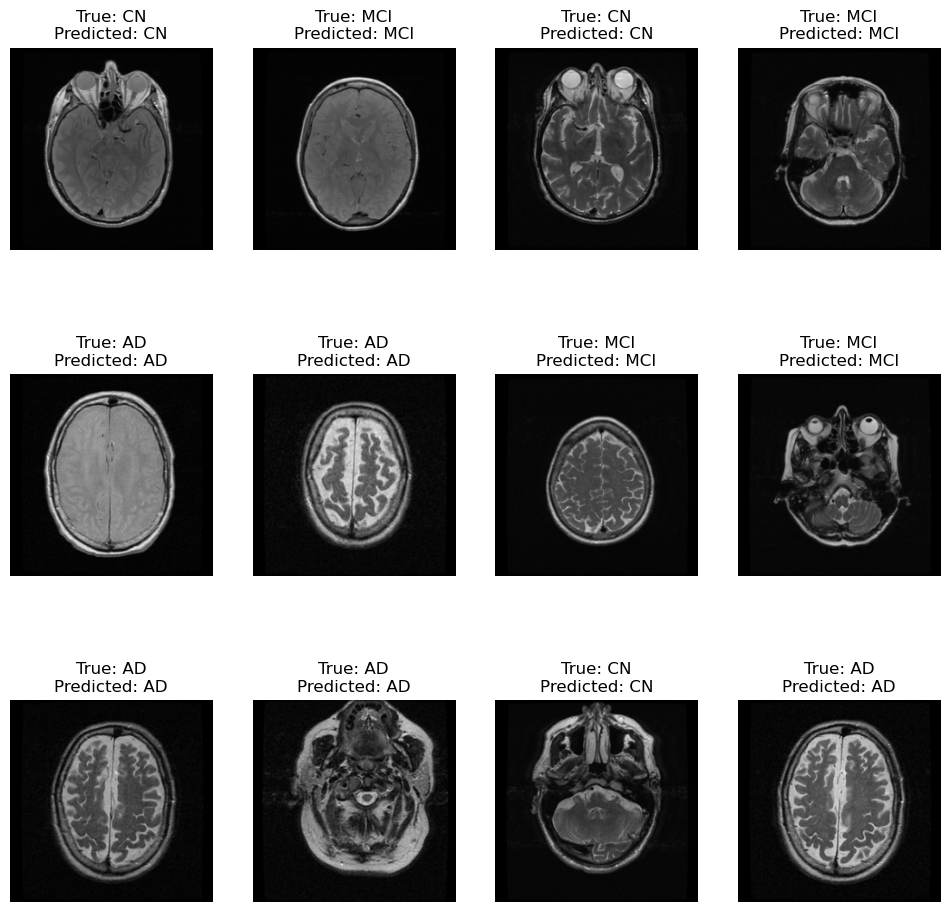

In [ ]:
# Make predictions on the test images
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)  # converting softmax output to class label

# Show the predicted images with labels
show_predicted_images(test_images, test_labels, predicted_labels, class_names)


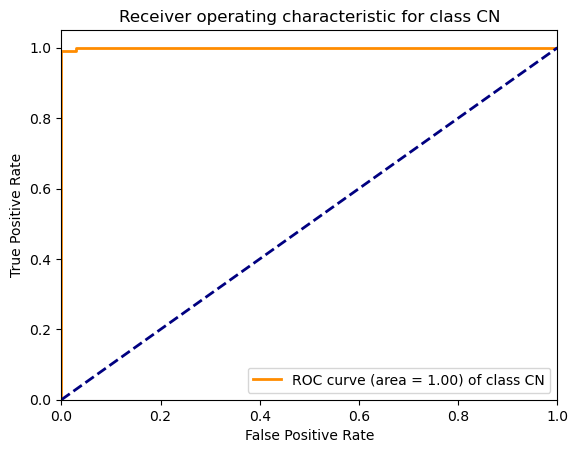

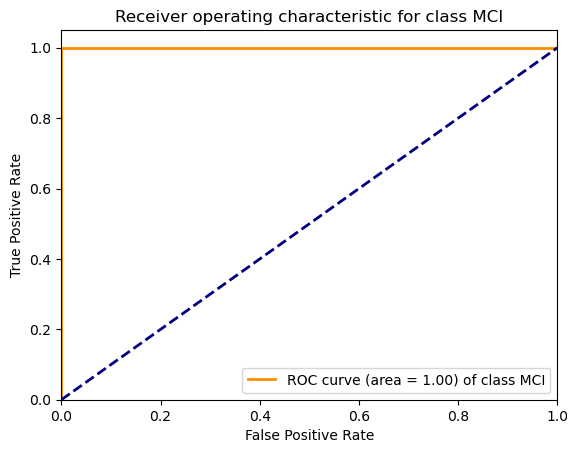

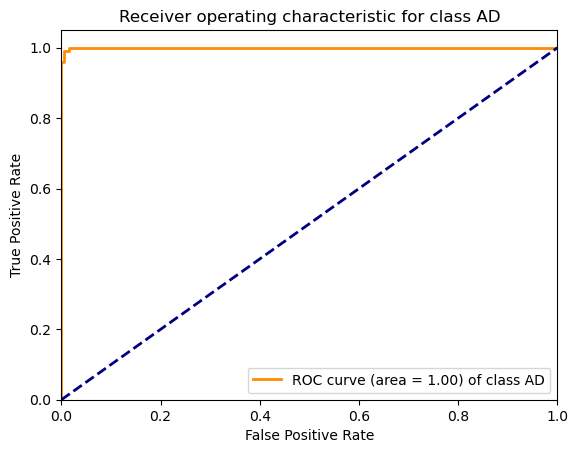

In [ ]:
# Define class names and number of classes
class_names = ['CN', 'MCI', 'AD']
num_classes = len(class_names)

# Binarize the labels
test_labels_bin = label_binarize(test_labels, classes=range(num_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
for i in range(num_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], color='darkorange', lw=2,
             label='ROC curve (area = %0.2f) of class {0}'.format(class_names[i]) % roc_auc[i])
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for class {0}'.format(class_names[i]))
    plt.legend(loc="lower right")
    plt.show()


In [ ]:
# Convert predictions to label encoding
predictions_decoded = np.argmax(predictions, axis=1)

# Define class names
class_names = ['CN', 'MCI', 'AD']

# Print the classification report
print(classification_report(test_labels, predictions_decoded, target_names=class_names))


              precision    recall  f1-score   support

          CN       1.00      0.94      0.97       100
         MCI       0.98      1.00      0.99       100
          AD       0.96      1.00      0.98       100

    accuracy                           0.98       300
   macro avg       0.98      0.98      0.98       300
weighted avg       0.98      0.98      0.98       300



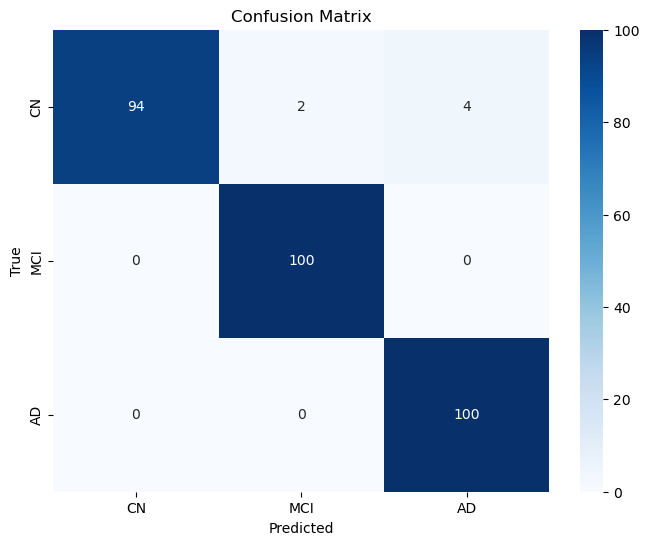

In [ ]:
# If test_labels is already in label encoded format (not one-hot encoded)
test_labels_decoded = test_labels

# Convert predictions to label encoded
predictions_decoded = np.argmax(predictions, axis=1)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(test_labels_decoded, predictions_decoded)

# Define class names
class_names = ['CN', 'MCI', 'AD']  # Replace with your class names

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
# Define function to get the name of the last convolutional layer
def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        if 'conv' in layer.name:  # This checks if the word 'conv' is in the layer's name
            return layer.name
    raise ValueError("No convolutional layers found in the model.")

# Use:
conv_last_name = get_last_conv_layer(model)

In [ ]:
# Define function 'show_gradcam' that generates and displays a Grad-CAM visualization
def show_gradcam(model, images_batch, true_label_images_batch):
    last_conv_layer_name = get_last_conv_layer(model)  # Use the function to get the layer name
    last_conv_layer = model.get_layer(last_conv_layer_name)
    grad_model = Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])

    class_names = ["CN", "MCI", "AD"]  # define your class names here

    for i in range(images_batch.shape[0]):
        image = images_batch[i]
        true_label_image = true_label_images_batch[i]

        image_expanded = tf.expand_dims(image, 0)
        with tf.GradientTape() as tape:
            conv_output_values, predictions = grad_model(image_expanded)
            predicted_class = class_names[np.argmax(predictions[0].numpy())]
            loss = tf.keras.losses.mean_squared_error(true_label_image, predictions[0])

        grads = tape.gradient(loss, conv_output_values)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output_values), axis=-1)
        heatmap = np.maximum(heatmap, 0)

        if np.max(heatmap) == 0:
            print("Warning: Entire heatmap is zero for image:", i)
            return False
        else:
            heatmap /= np.max(heatmap)

        heatmap = heatmap.squeeze()
        heatmap_resized = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
        heatmap_uint8 = np.uint8(255 * heatmap_resized)
        heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

        image_uint8 = np.uint8(255 * image.numpy()) if np.max(image) <= 1 else np.uint8(image.numpy())
        overlay_image = cv2.addWeighted(image_uint8, 0.6, heatmap_color, 0.4, 0)

        _, thresh = cv2.threshold(heatmap_uint8, 127, 255, 0)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(overlay_image, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Bounding box in green

        plt.figure(figsize=(14, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image_uint8, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(np.uint8(image * 255), cv2.COLOR_BGR2RGB))
        plt.title(f'{predicted_class} Image')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(overlay_image, cv2.COLOR_BGR2RGB))
        plt.title('Grad-CAM with Regions of Interest')
        plt.axis('off')

        legend_elements = [plt.Rectangle((0,0),1,1,fc="green", edgecolor='none'),
                           plt.Rectangle((0,0),1,1,fc="red", edgecolor='none')]

        plt.legend(handles=legend_elements, labels=['Area of Interest', 'Highlight Regions'], loc=4)
        cv2.putText(overlay_image, "Areas of Interest", (10, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1, cv2.LINE_AA)

        plt.show()
        return True


In [ ]:
# Initialize count
processed_count = 0
target_count = 20

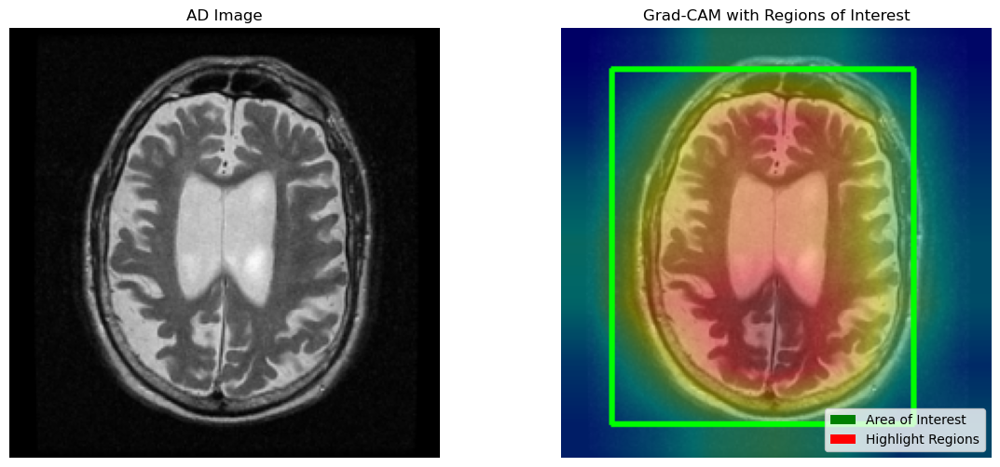

Processed count after image 1: 1


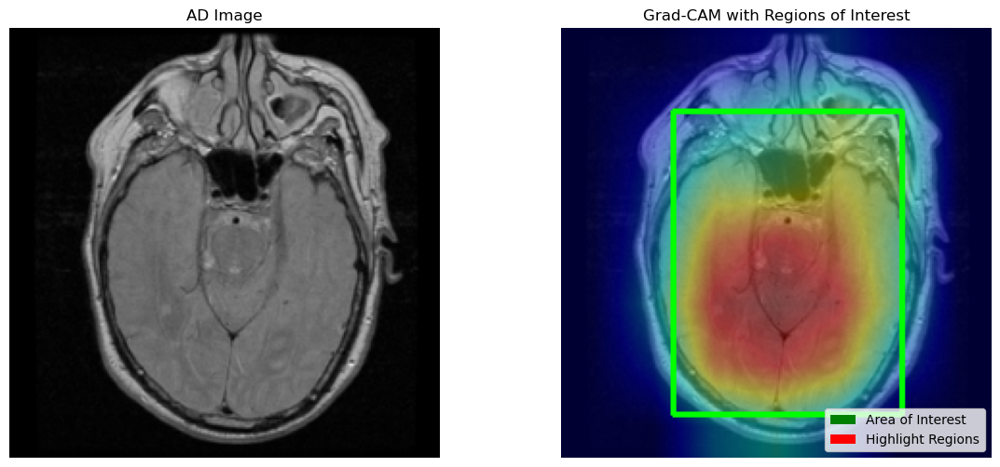

Processed count after image 2: 2


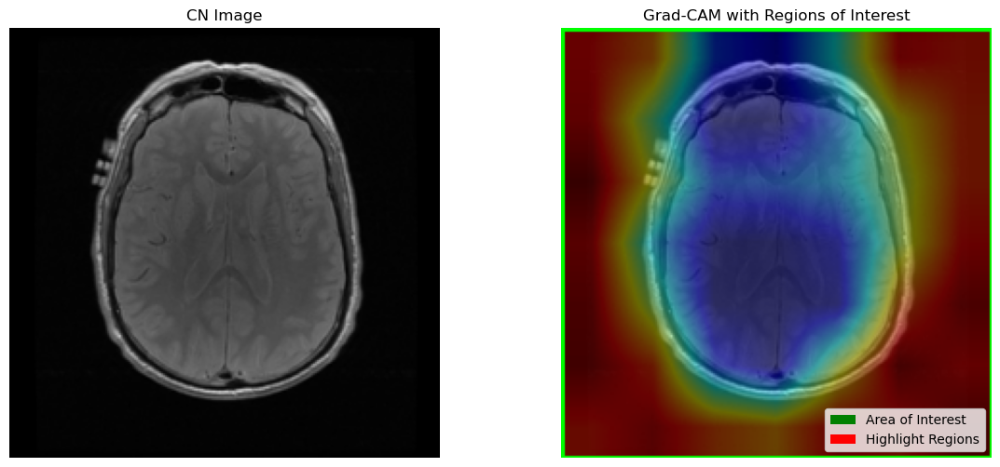

Processed count after image 3: 3


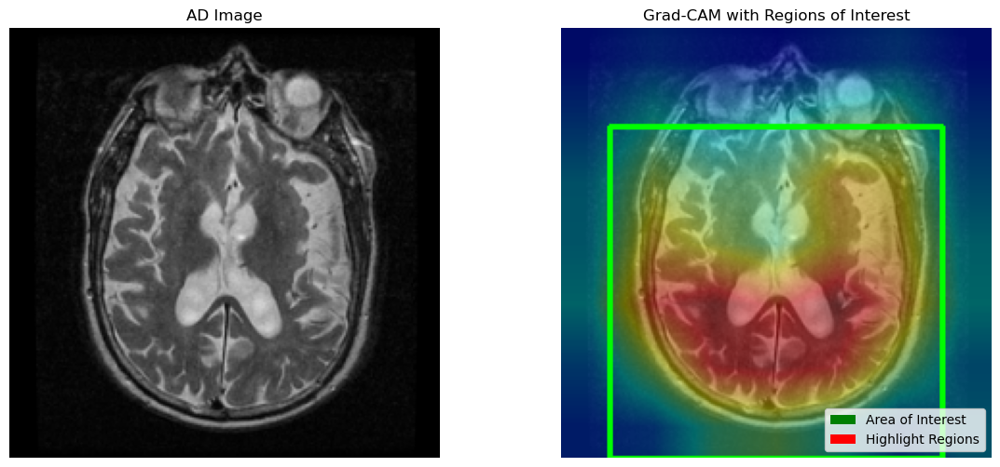

Processed count after image 4: 4


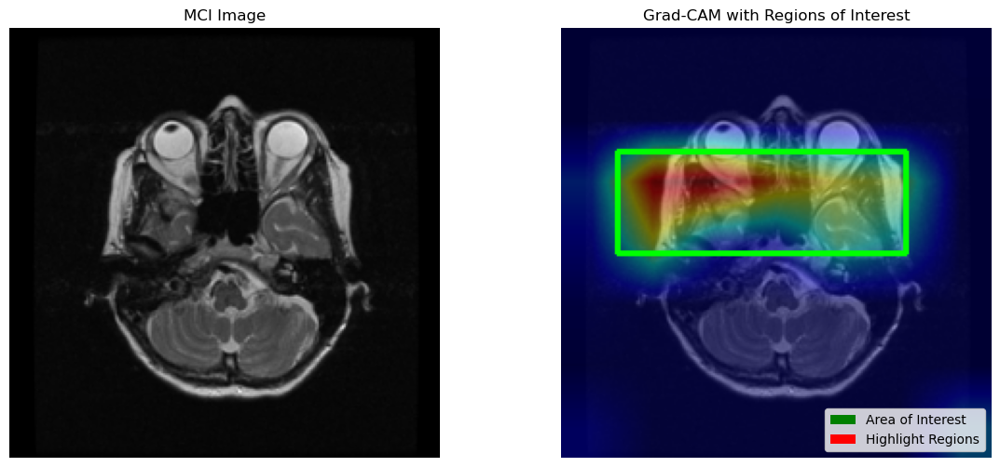

Processed count after image 5: 5


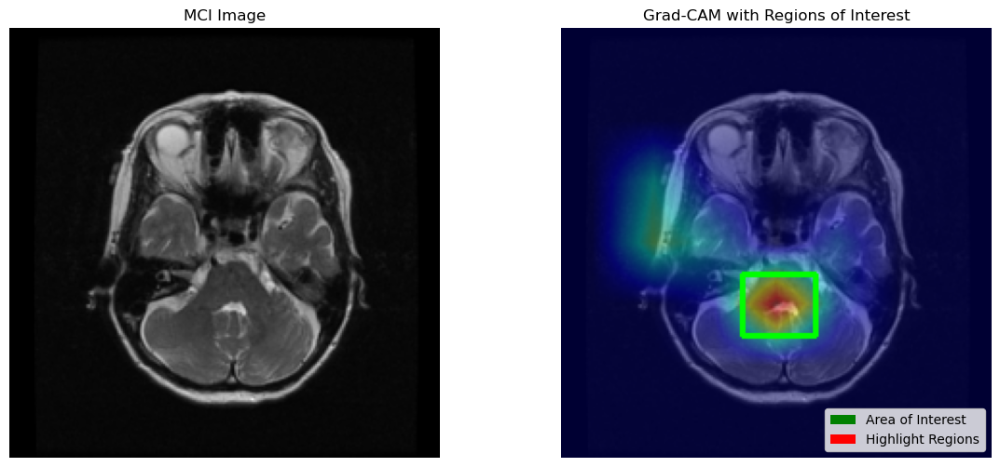

Processed count after image 6: 6


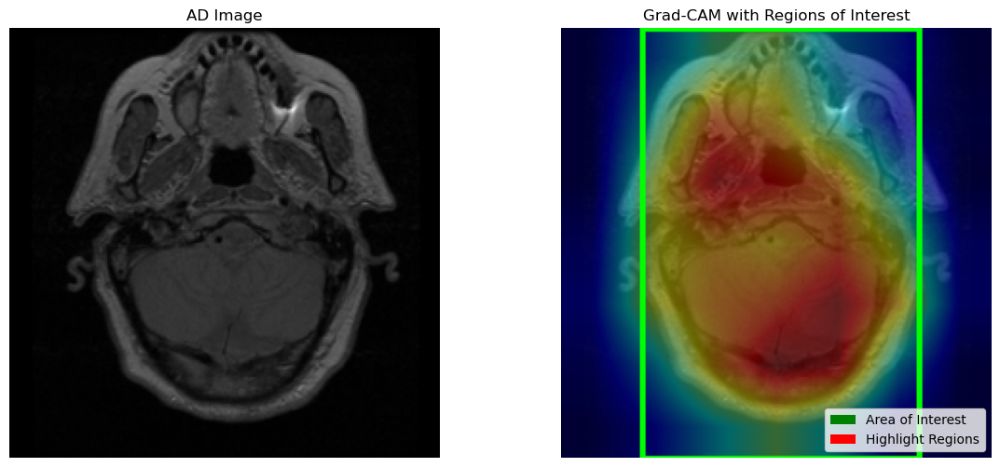

Processed count after image 7: 7


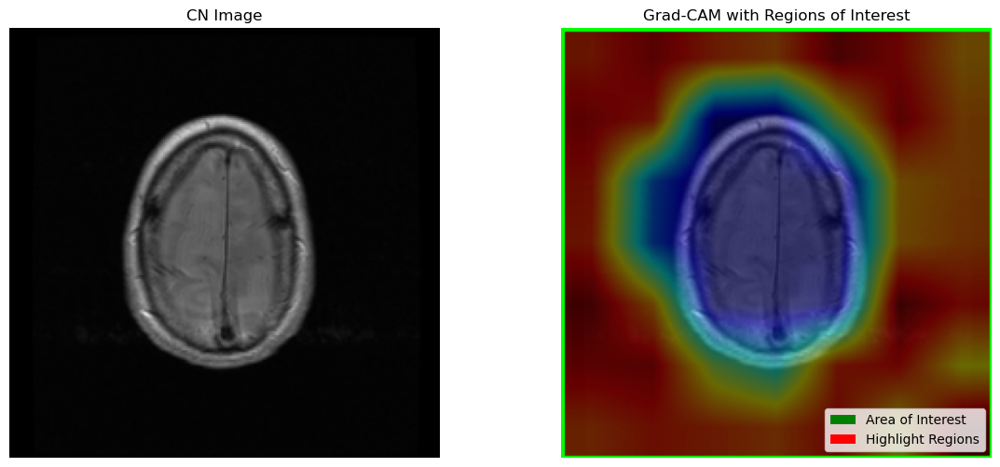

Processed count after image 8: 8


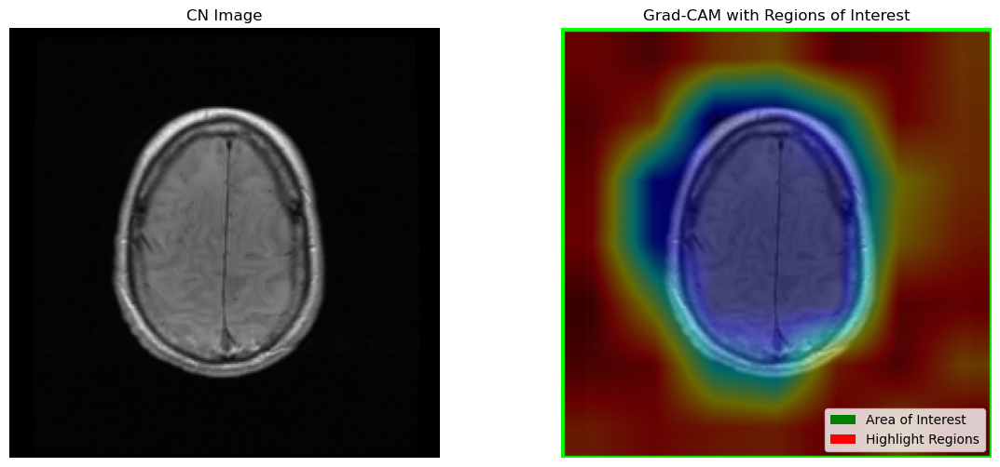

Processed count after image 9: 9
Processed count after image 10: 9


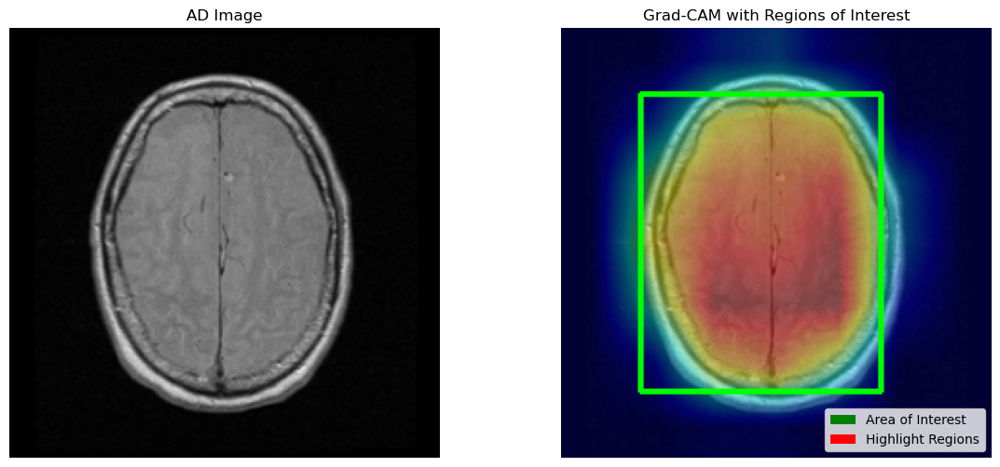

Processed count after image 11: 10


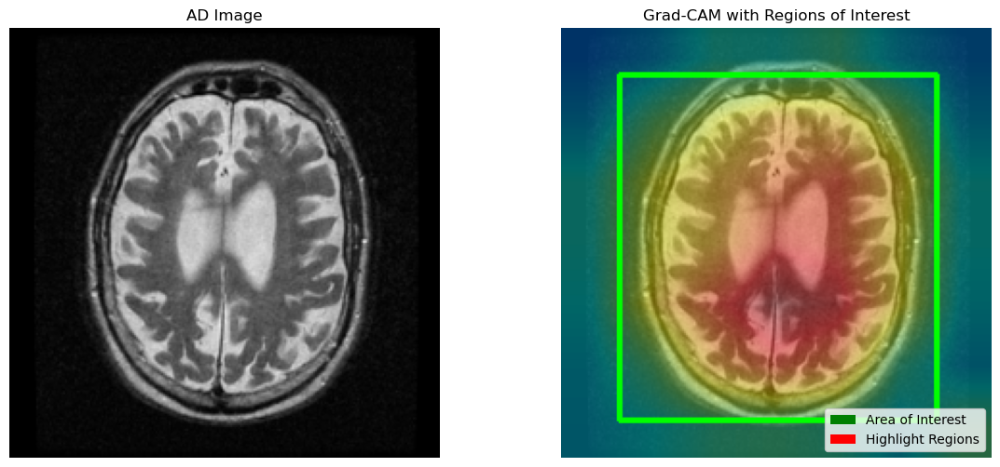

Processed count after image 12: 11


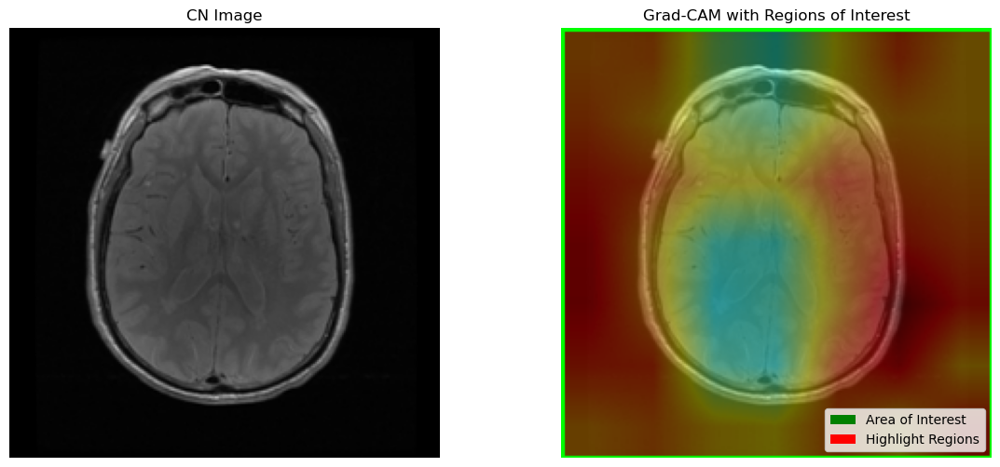

Processed count after image 13: 12


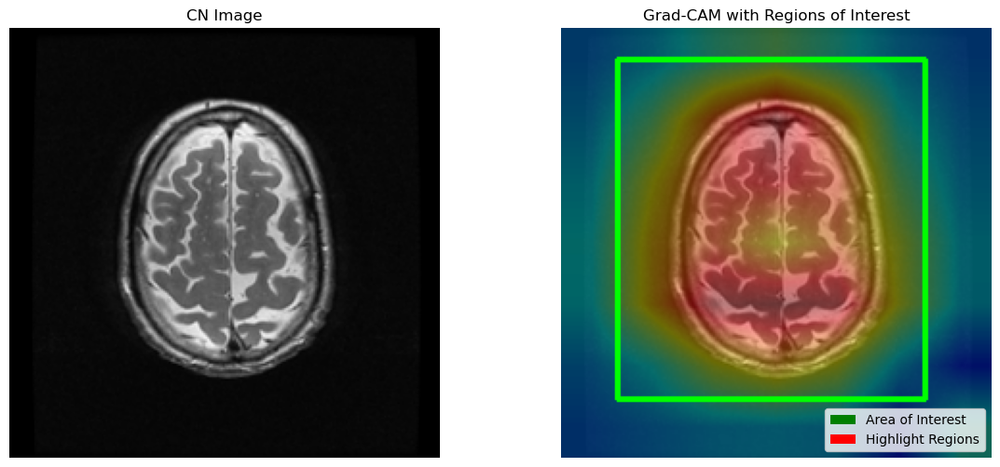

Processed count after image 14: 13


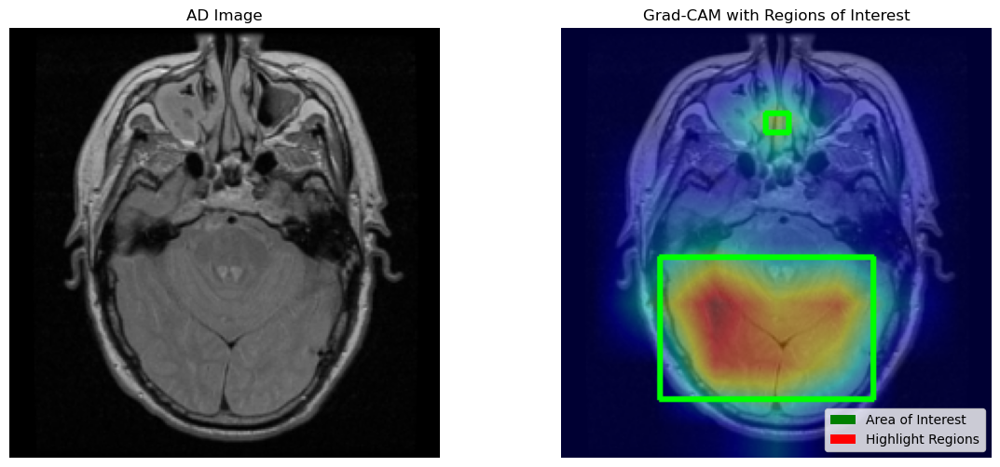

Processed count after image 15: 14


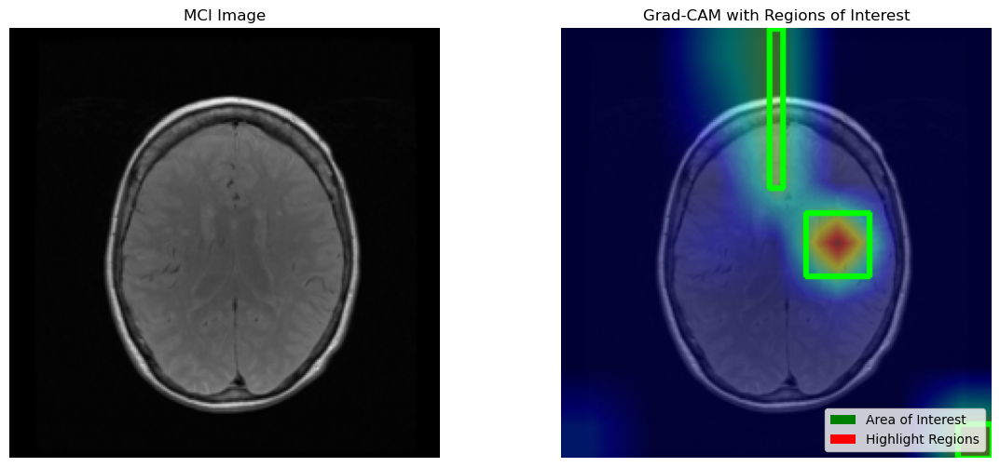

Processed count after image 16: 15


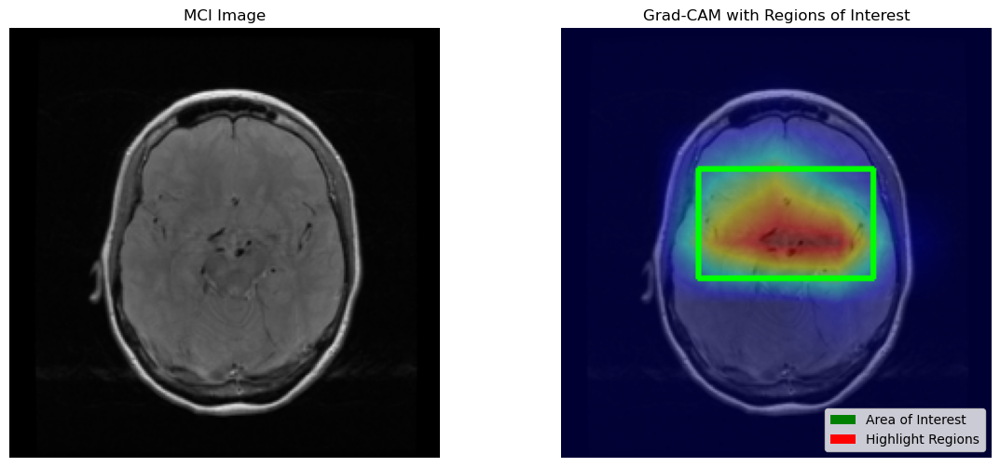

Processed count after image 17: 16


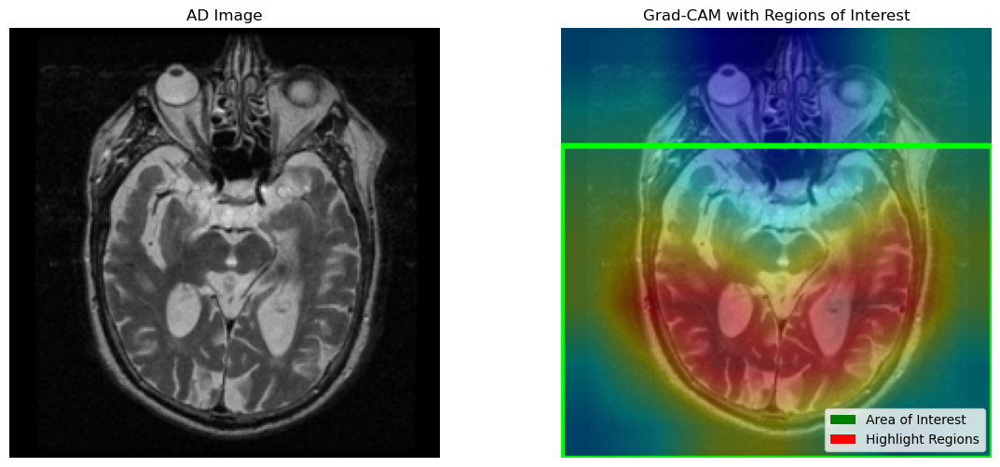

Processed count after image 18: 17


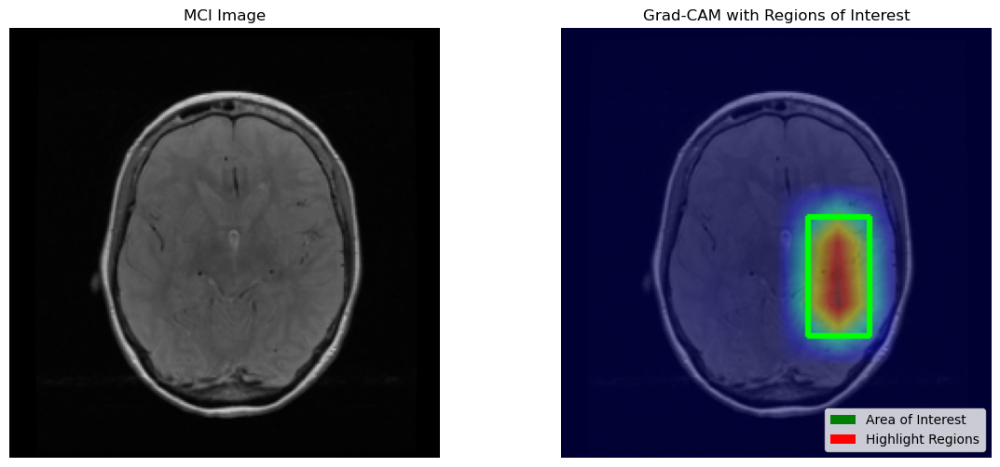

Processed count after image 19: 18


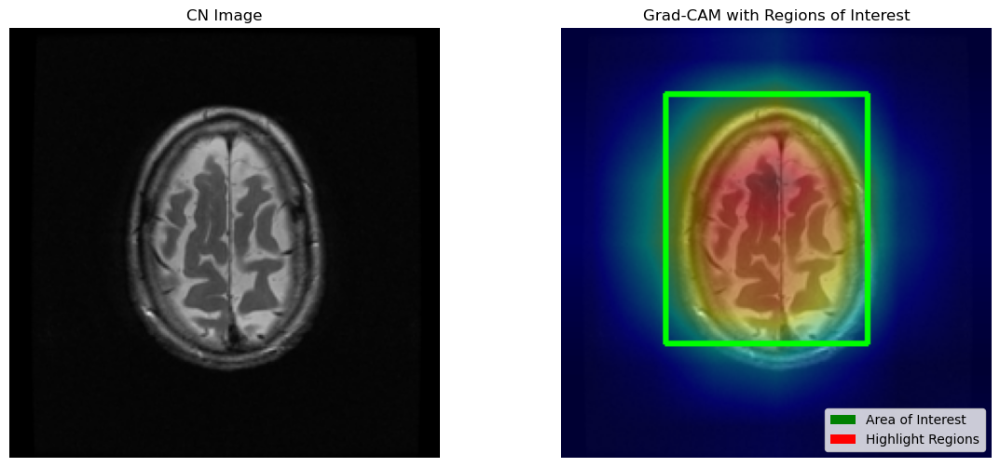

Processed count after image 20: 19


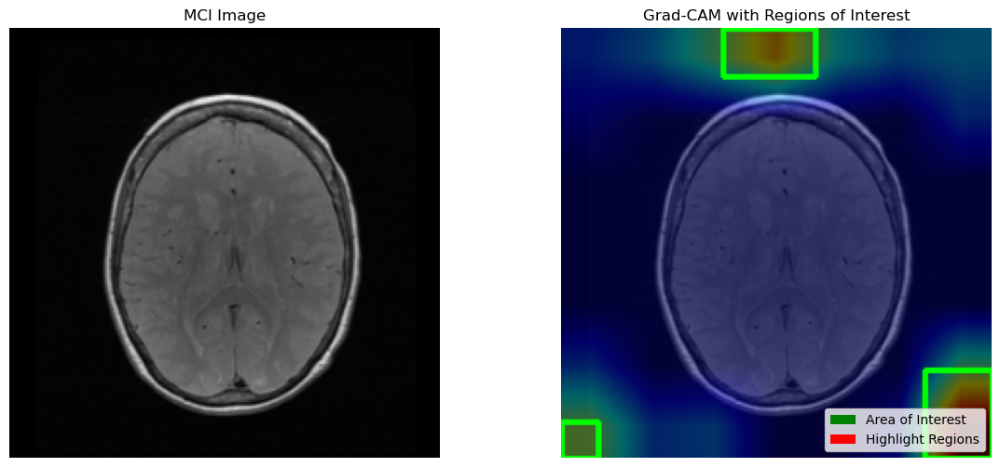

Processed count after image 21: 20


In [ ]:
# Flatten the dataset and iterate over it
for index, (image, true_label_image) in enumerate(test_dataset.unbatch().as_numpy_iterator()):
    if processed_count >= target_count:
        break

    # Process individual image
    image = tf.expand_dims(image, 0)  # Add batch dimension
    true_label_image = tf.expand_dims(true_label_image, 0)  # Add batch dimension
    result = show_gradcam(model, image, true_label_image)

    # If heatmap is not zero, increment the processed_count
    if result:  # Check the returned value from show_gradcam
        processed_count += 1

    print(f"Processed count after image {index + 1}: {processed_count}")

In [ ]:
def show_lime_explanation(model, images_batch, true_label_images_batch, class_names=['MCI', 'AD', 'CN']):
    explainer = lime_image.LimeImageExplainer()

    for i in range(images_batch.shape[0]):
        image = images_batch[i].numpy()
        image = np.squeeze((image * 255).astype(np.uint8)) if np.max(image) <= 1 else np.squeeze(image.astype(np.uint8))
        true_label = class_names[int(true_label_images_batch[i].numpy())]

        def predict_fn(images):
            images = images.astype(np.float32) / 255.0
            return model.predict(images, verbose=0)

        explanation = explainer.explain_instance(image, predict_fn, top_labels=3, hide_color=0, num_samples=1000)

        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0],
            positive_only=False,
            hide_rest=False,
            num_features=5,
            min_weight=0.1
        )

        fig, ax = plt.subplots(1, 2, figsize=(10, 4))

        ax[0].imshow(image, cmap='gray' if image.ndim == 2 else None)
        ax[0].set_title(true_label, fontsize=8)  # Set the title to true_label
        predicted_label = class_names[np.argmax(predict_fn(image.reshape(1, *image.shape)))]
        ax[0].set_xlabel(f'True: {true_label} | Predicted: {predicted_label}', fontsize=6)
        ax[0].axis('off')

        ax[1].imshow(temp)
        ax[1].set_title('LIME Explanation', fontsize=8)
        ax[1].axis('off')

        lime_coords = np.where(mask)
        if lime_coords[0].size != 0 and lime_coords[1].size != 0:
            coord_min = (np.min(lime_coords[1]), np.min(lime_coords[0]))
            coord_max = (np.max(lime_coords[1]), np.max(lime_coords[0]))
            rect = patches.Rectangle(coord_min, coord_max[0] - coord_min[0], coord_max[1] - coord_min[1], linewidth=1,
                                     edgecolor='r', facecolor='none')
            ax[1].add_patch(rect)

        handles = [patches.Rectangle((0, 0), 1, 1, color="white", ec="red", lw=1)]
        labels = ["Area influencing prediction"]
        ax[1].legend(handles, labels, loc='lower right', fontsize=6, borderpad=0.2, labelspacing=0.2,
                     handletextpad=0.2)

        plt.tight_layout()
        plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

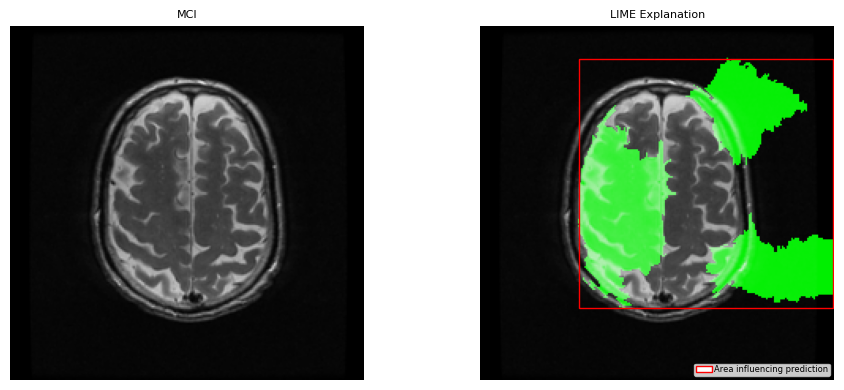

  0%|          | 0/1000 [00:00<?, ?it/s]

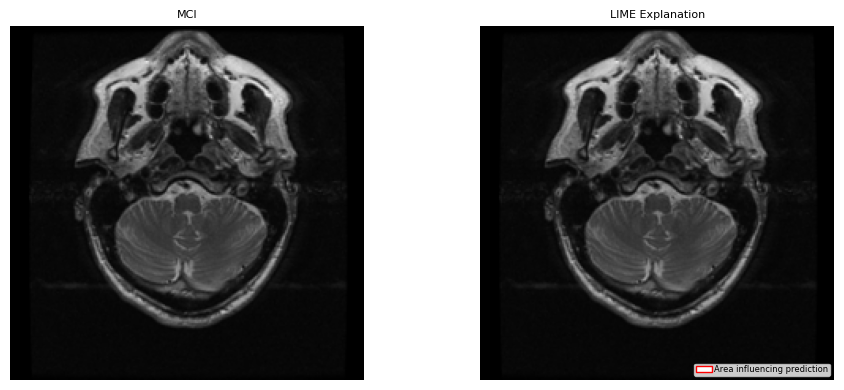

  0%|          | 0/1000 [00:00<?, ?it/s]

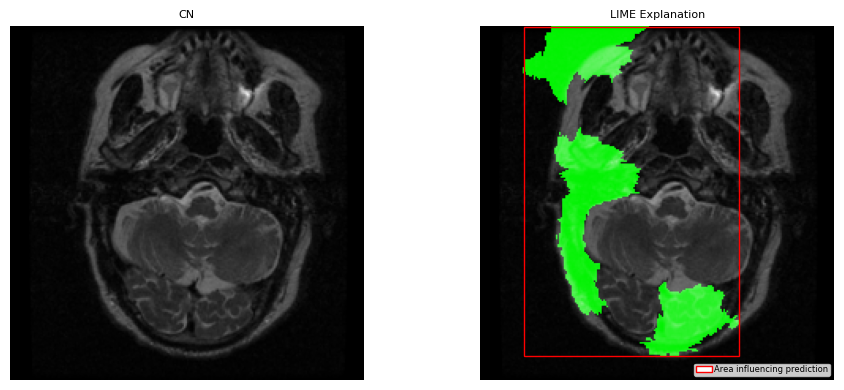

  0%|          | 0/1000 [00:00<?, ?it/s]

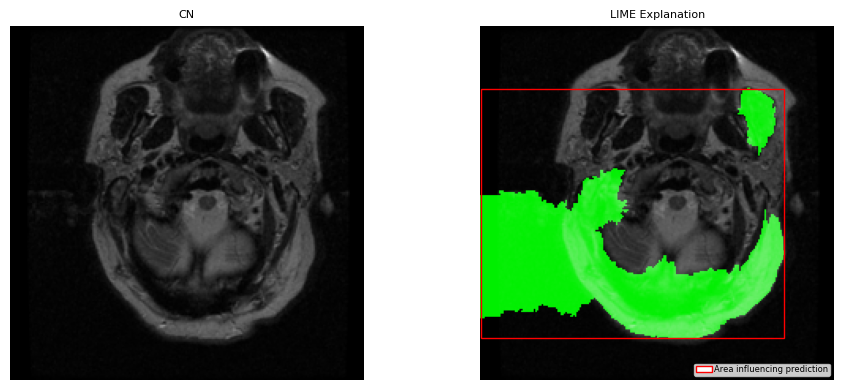

  0%|          | 0/1000 [00:00<?, ?it/s]

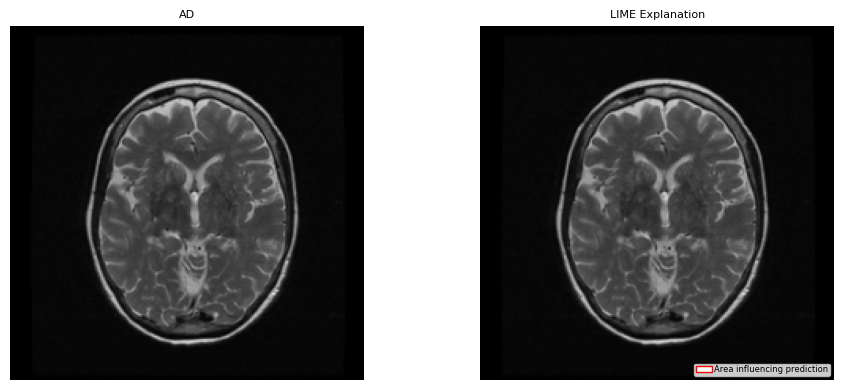

  0%|          | 0/1000 [00:00<?, ?it/s]

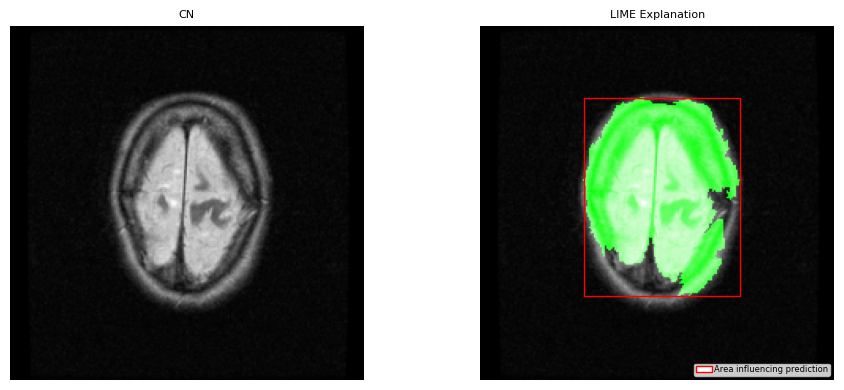

  0%|          | 0/1000 [00:00<?, ?it/s]

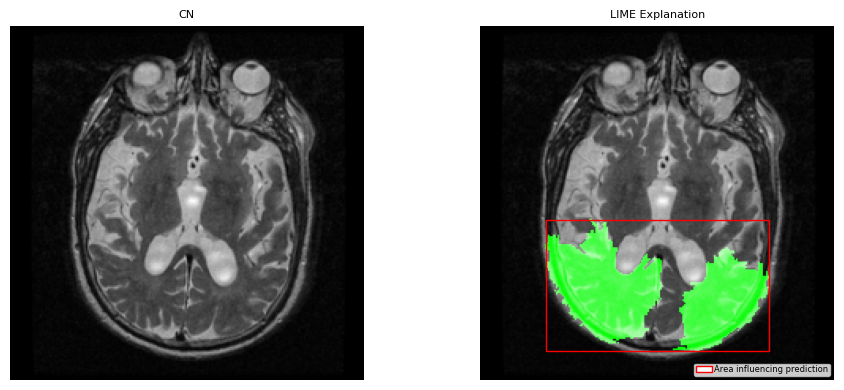

  0%|          | 0/1000 [00:00<?, ?it/s]

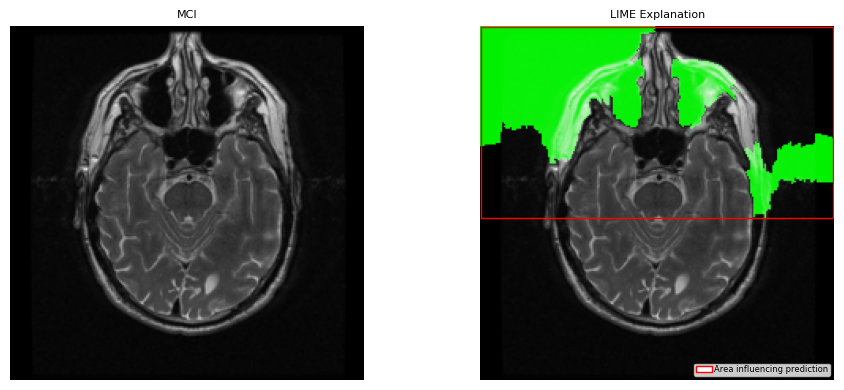

  0%|          | 0/1000 [00:00<?, ?it/s]

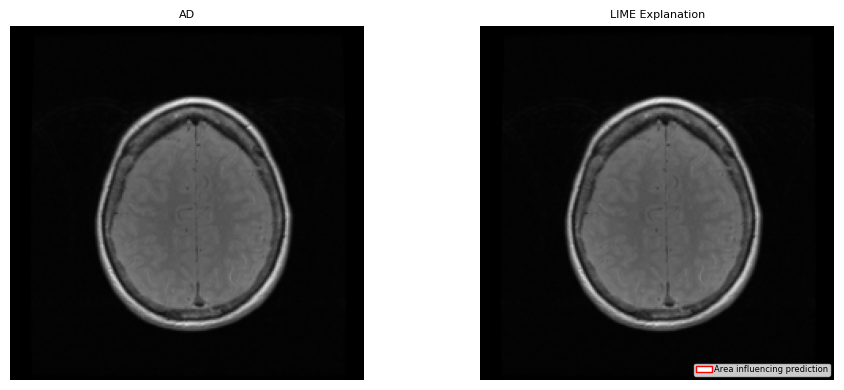

  0%|          | 0/1000 [00:00<?, ?it/s]

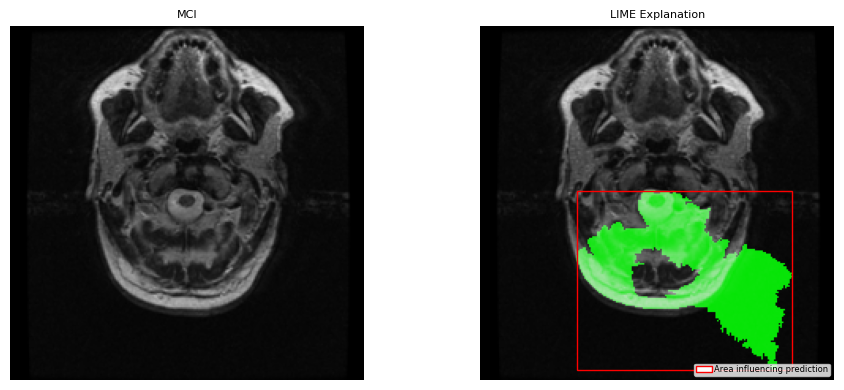

  0%|          | 0/1000 [00:00<?, ?it/s]

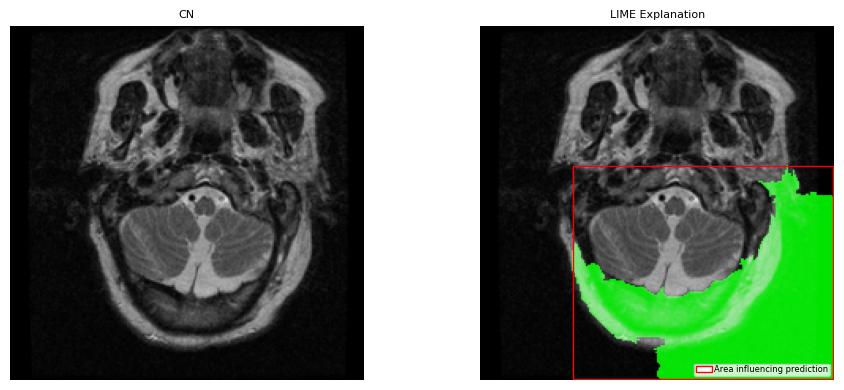

  0%|          | 0/1000 [00:00<?, ?it/s]

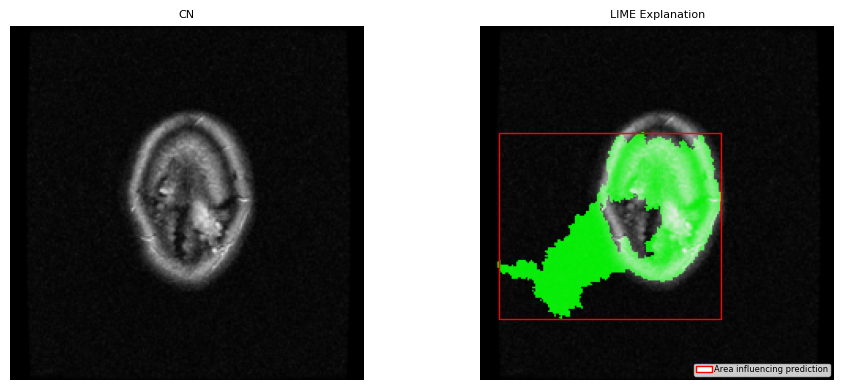

  0%|          | 0/1000 [00:00<?, ?it/s]

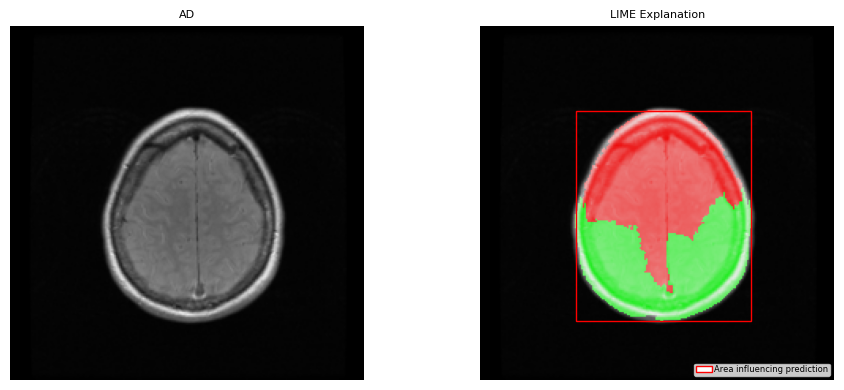

  0%|          | 0/1000 [00:00<?, ?it/s]

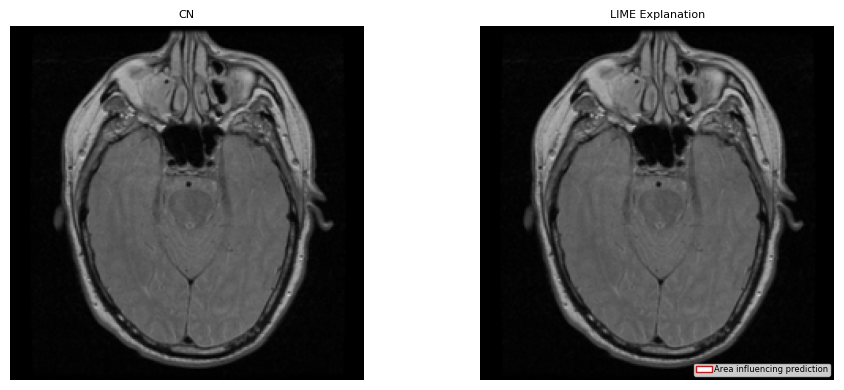

  0%|          | 0/1000 [00:00<?, ?it/s]

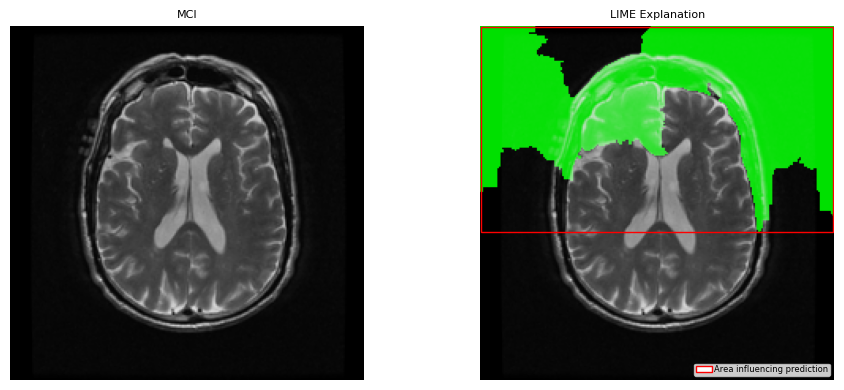

  0%|          | 0/1000 [00:00<?, ?it/s]

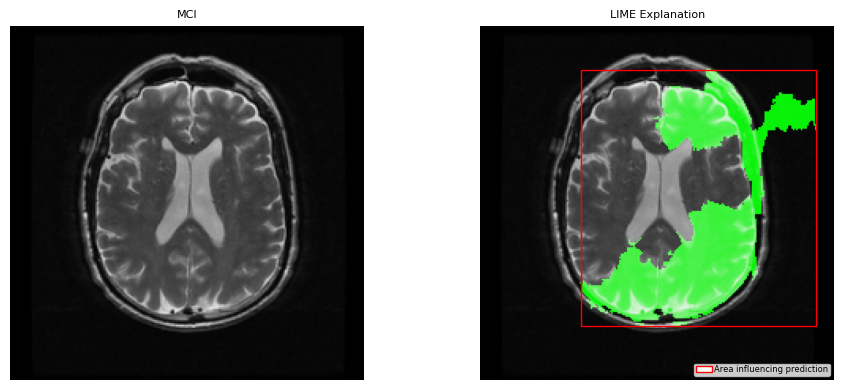

  0%|          | 0/1000 [00:00<?, ?it/s]

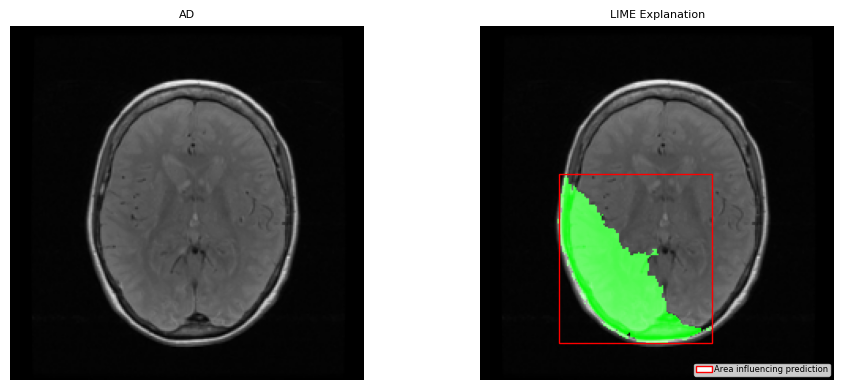

  0%|          | 0/1000 [00:00<?, ?it/s]

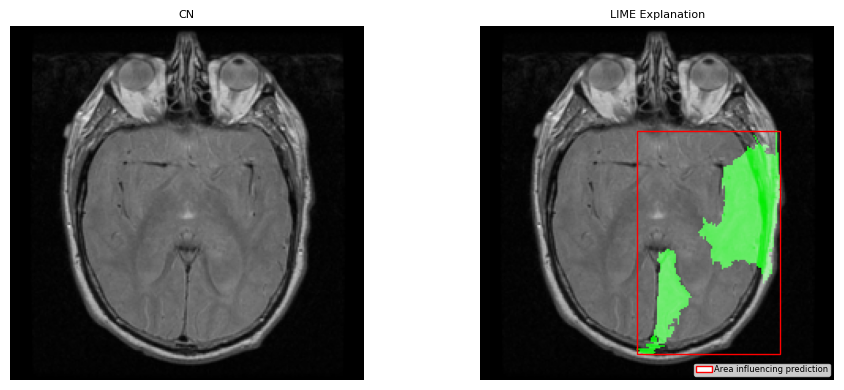

  0%|          | 0/1000 [00:00<?, ?it/s]

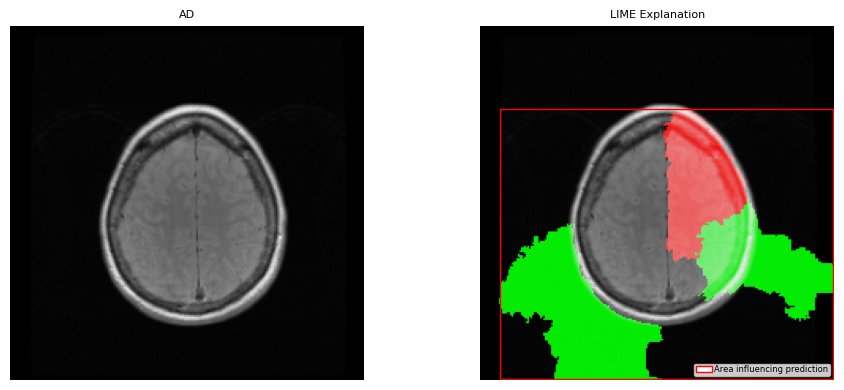

  0%|          | 0/1000 [00:00<?, ?it/s]

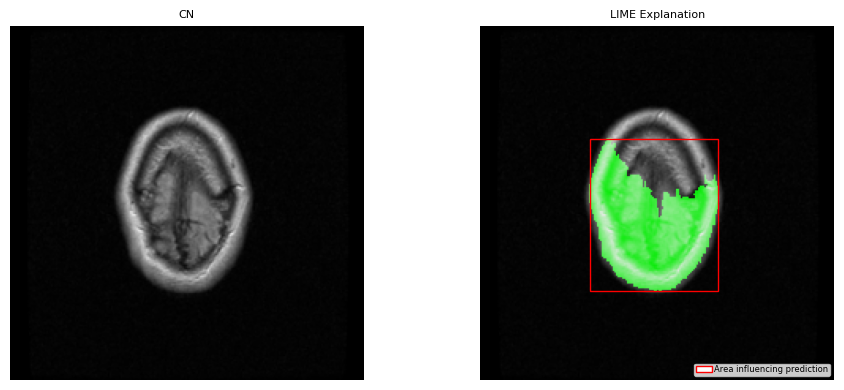

Processed count after this batch: 20


In [ ]:
# Assume processed_count and target_count are defined
processed_count = 0
target_count = 20  # replace some_number with the desired value

for images_batch, true_label_images_batch in test_dataset:
    if processed_count >= target_count:
        break

    num_images_to_process = min(len(images_batch), target_count - processed_count)

    show_lime_explanation(model, images_batch[:num_images_to_process], true_label_images_batch[:num_images_to_process])

    processed_count += num_images_to_process
    print(f"Processed count after this batch: {processed_count}")


In [ ]:
#Save the model
# The '.keras' extension indicates that the model should be saved to HDF5.
model.save('EfficientNetB0_Final_a_dicom_classification_model.keras')